##### Buisness Problem

In our daily lives, we often encounter numerous products on digital platforms and face the challenge of choosing the right one from a wide range of options. To aid in this decision-making process, customer reviews.ratings, feedbacks  plays a crucial role. Reviews provide valuable feedback from previous users, including ratings and comments.  This  analysis helps customers gauge the overall satisfaction or dissatisfaction associated with a product by evaluating the collective sentiment expressed in the reviews,rating and feedbacks.

##### Data

Data Columns

1.product_id - Unique Id of the product

2.author_id - Random identifier that can be used to aggregate reviews written by a single author.

3.review_id - The unique ID of the review.

4.primary_category - Main category of the products

5.brand_id - Brand unique id

6.rating - The 1-5 star rating of the review.

7.brand_names - Name of the brand associated with product

8.total_votes - Number of total votes the review received.

9.loves_count - The number of people who have marked this product as a favorite

10.size - The size of the product, which may be in oz, ml, g, packs, or other units depending on the product type.

11.price_usd - The price of product in usd

12.review - The no of reviews on product.

13.submission_date - The date the review was written.

14.sale_price_usd - The selling price of product

15.secondary_category - Secondary_category in the products

16.Tertiary category - Tertiary category in the products

17.review_text - The review text.

18.ingredients - The ingredients used in the product etc.

##### Solution

Analysing different products on the basis of brand, peoples feedback and ingredients used.Analysing different products on the basis of reviews, rating, people made favorite and analyzing sentiment of frequently visiting customers and least visiting customers.Analysis of the frequent used positive and negative words for the review through sentiment analysis technique. This analysis helps people to gain ideas about the products on the basis of different criteria explored throughout the project

#### Loading required libraries

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker


import pyspark.sql.functions as F
from pyspark.sql.functions import pandas_udf,window
from pyspark.sql.types import StringType,FloatType
from pyspark.sql.functions import col,to_date, year, month,when,corr,explode,desc,split,row_number
from pyspark.sql.functions import sum as spark_sum
from tabulate import tabulate

#sentiment analysis
from pyspark.ml.feature import StopWordsRemover
from pyspark.ml.feature import RegexTokenizer
from pyspark.ml.feature import CountVectorizer
from pyspark.ml import PipelineModel
from pyspark.ml.feature import Tokenizer


#### Data Source

Here is the dataset link for the project

https://www.kaggle.com/datasets/nadyinky/sephora-products-and-skincare-reviews/code?select=reviews_0_250.csv

### Loading data

#### Loading product information

In [0]:
# File location 
file_location = "/FileStore/tables/product_info.csv"
df_makeup_products = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)

#### Loading reviews

In [0]:
file_location = "/FileStore/tables/reviews_0_250.csv"

df_first_part_review = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)


In [0]:
df_first_part_review.count()

Out[98]: 607231

In [0]:
file_location = "/FileStore/tables/reviews_250_500.csv"

df_second_part_review = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)

In [0]:
df_second_part_review.count()

Out[100]: 208088

In [0]:
file_location = "/FileStore/tables/reviews_500_750.csv"

df_third_part_review = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)

In [0]:
df_third_part_review.count()

Out[102]: 208088

In [0]:
file_location = "/FileStore/tables/reviews_750_1000.csv"

df_fourth_part_review = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)

In [0]:
df_fourth_part_review.count()

Out[104]: 116838

In [0]:
file_location = "/FileStore/tables/reviews_1000_1500.csv"

df_final_part_review = spark.read.format('csv') \
      .option('header', 'true') \
      .option('delimiter', ',') \
      .option('inferSchema', 'true') \
      .load(file_location)

In [0]:
df_final_part_review.count()

Out[106]: 119819

##### Union of all review files to one single one

In [0]:
# union all reviews 
df_review_unioned = df_first_part_review.union(df_second_part_review)
df_reviews_initial = df_review_unioned.union(df_third_part_review)
df_reviews_initial_one = df_reviews_initial.union(df_fourth_part_review)
df_reviews = df_reviews_initial_one.union(df_final_part_review)

In [0]:
print("The final count on the dataset is {}".format(df_reviews.count()))

The final count on the dataset is 1260064


#### Checking and removing duplicates

In [0]:
# Remove duplicate rows
df_reviews = df_reviews.dropDuplicates()

In [0]:
# Drop rows with missing values
df_reviews = df_reviews.na.drop()

#### Checking df_makeup_products column with df_reviews column

In [0]:
cols_to_use = list(set(df_makeup_products.columns) - set(df_reviews.columns))
cols_to_use.append(col('product_id'))

print(cols_to_use)


['sephora_exclusive', 'new', 'limited_edition', 'variation_desc', 'out_of_stock', 'sale_price_usd', 'value_price_usd', 'child_max_price', 'reviews', 'child_count', 'variation_value', 'highlights', 'variation_type', 'ingredients', 'secondary_category', 'online_only', 'loves_count', 'size', 'child_min_price', 'primary_category', 'brand_id', 'tertiary_category', Column<'product_id'>]


#### Merging two dataset from inner join

In [0]:
from pyspark.sql.functions import col

# Convert column names to Column objects
cols_to_use = [col_name for col_name in cols_to_use]

# Perform the join operation

df = df_makeup_products.select(cols_to_use).join(df_reviews, on='product_id', how='inner')

In [0]:
# Show the resulting DataFrame
display(df)

product_id,sephora_exclusive,new,limited_edition,variation_desc,out_of_stock,sale_price_usd,value_price_usd,child_max_price,reviews,child_count,variation_value,highlights,variation_type,ingredients,secondary_category,online_only,loves_count,size,child_min_price,primary_category,brand_id,tertiary_category,_c0,author_id,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,review_text,review_title,skin_tone,eye_color,skin_type,hair_color,product_name,brand_name,price_usd
P420652,1,0,0,null,0,null,null,24,16118,3,Original,"['allure 2019 Best of Beauty Award Winner', 'Community Favorite', 'Vitamin C', 'Hydrating', 'Good for: Dryness', 'Without Parabens']",Color,"['Diisostearyl Malate, Hydrogenated Polyisobutene, Phyto- Steryl/Isostearyl/Cetyl/Stearyl/Behenyl Dimer Dilinoleate, Hydrogenated Poly(C6-14 Olefin), Polybutene, Microcrystalline Wax / Cera Microcristallina / Cire Microcri Stalline, Butyrospermum Parkii (Shea) Butter, Synthetic Wax, Ethylene/Propylene/Styrene Copolymer, Sucrose Tetrastearate Triacetate, Mica, Euphorbia Cerifera (Candelilla) Wax / Candelilla Cera Hydrocarbons / Cire De Candelilla, Candelilla Wax Esters, Astrocaryum Murumuru Seed Butter, Titanium Dioxide (Ci 77891), Fragrance / Parfum, Glyceryl Caprylate, Polyglyceryl-2 Diisostearate, Butylene/Ethylene/Styrene Copolymer, Copernicia Cerifera (Carnauba) Wax / Copernicia Cerifera Cera / Cire De Carnauba, Methicone, Polyglyceryl-2 Triisostearate, Cocos Nucifera (Coconut) Oil, Yellow 6 Lake (Ci 15985), Pentaerythrityl Tetra-Di-T-Butyl Hydroxyhydrocinnamate, Red 6 (Ci 15850), Ascorbic Acid, Water / Aqua / Eau, Glycerin, Propanediol, Bht, Punica Granatum Fruit Juice, Rubus Idaeus (Raspberry) Juice, Vitis Vinifera (Grape) Juice']",Lip Balms & Treatments,0,1081315,0.7 oz/ 20 g,24,Skincare,6125,null,138,44398961569,3,0.0,1.0,2,0,2,2023-02-23,I would not repurchase as there are better ones out there. It dose work at keeping what moisture I have in my lips but dose not add any which really sucks.,Nothing special,fairLight,brown,dry,red,Lip Sleeping Mask Intense Hydration with Vitamin C,LANEIGE,24.0
P420652,1,0,0,null,0,null,null,24,16118,3,Original,"['allure 2019 Best of Beauty Award Winner', 'Community Favorite', 'Vitamin C', 'Hydrating', 'Good for: Dryness', 'Without Parabens']",Color,"['Diisostearyl Malate, Hydrogenated Polyisobutene, Phyto- Steryl/Isostearyl/Cetyl/Stearyl/Behenyl Dimer Dilinoleate, Hydrogenated Poly(C6-14 Olefin), Polybutene, Microcrystalline Wax / Cera Microcristallina / Cire Microcri Stalline, Butyrospermum Parkii (Shea) Butter, Synthetic Wax, Ethylene/Propylene/Styrene Copolymer, Sucrose Tetrastearate Triacetate, Mica, Euphorbia Cerifera (Candelilla) Wax / Candelilla Cera Hydrocarbons / Cire De Candelilla, Candelilla Wax Esters, Astrocaryum Murumuru Seed Butter, Titanium Dioxide (Ci 77891), Fragrance / Parfum, Glyceryl Caprylate, Polyglyceryl-2 Diisostearate, Butylene/Ethylene/Styrene Copolymer, Copernicia Cerifera (Carnauba) Wax / Copernicia Cerifera Cera / Cire De Carnauba, Methicone, Polyglyceryl-2 Triisostearate, Cocos Nucifera (Coconut) Oil, Yellow 6 Lake (Ci 15985), Pentaerythrityl Tetra-Di-T-Butyl Hydroxyhydrocinnamate, Red 6 (Ci 15850), Ascorbic Acid, Water / Aqua / Eau, Glycerin, Propanediol, Bht, Punica Granatum Fruit Juice, Rubus Idaeus (Raspberry) Juice, Vitis Vinifera (Grape) Juice']",Lip Balms & Treatments,0,1081315,0.7 oz/ 20 g,24,Skincare,6125,null,200,42532790481,5,1.0,1.0,4,0,4,2023-02-12,"I love it, the flavour and the little applicator that comes with it is very good. I love that you don’t need to much of it and the container lasts forever. The price is a bit high for my taste. But it does last a long time . But I do find that it doesn’t hydrate the lips for a long time like in order to keep the lips hydrated you need to use it every night",The flavour is immaculate,light,blue,combination,blonde,Lip Sleeping Mask Intense Hydration with Vitamin C,LANEIGE,24.0
P4

In [0]:
#dropping null values
df.dropna()

Out[114]: DataFrame[product_id: string, sephora_exclusive: int, new: int, limited_edition: int, variation_desc: string, out_of_stock: int, sale_price_usd: double, value_price_usd: double, child_max_price: string, reviews: string, child_count: string, variation_value: string, highlights: string, variation_type: string, ingredients: string, secondary_category: string, online_only: int, loves_count: string, size: string, child_min_price: string, primary_category: string, brand_id: string, tertiary_category: string, _c0: string, author_id: string, rating: string, is_recommended: string, helpfulness: string, total_feedback_count: string, total_neg_feedback_count: string, total_pos_feedback_count: string, submission_time: string, review_text: string, review_title: string, skin_tone: string, eye_color: string, skin_type: string, hair_color: string, product_name: string, brand_name: string, price_usd: string]

In [0]:
row_count = df.count()
column_count = len(df.columns)

print("Number of Rows: ", row_count)
print("Number of Columns: ", column_count)

Number of Rows:  273569
Number of Columns:  41


##### adding sentiment column from rating

In [0]:
# Convert the rating column to integer
df = df.withColumn('rating', col('rating').cast('integer'))
df.printSchema()

root
 |-- product_id: string (nullable = true)
 |-- sephora_exclusive: integer (nullable = true)
 |-- new: integer (nullable = true)
 |-- limited_edition: integer (nullable = true)
 |-- variation_desc: string (nullable = true)
 |-- out_of_stock: integer (nullable = true)
 |-- sale_price_usd: double (nullable = true)
 |-- value_price_usd: double (nullable = true)
 |-- child_max_price: string (nullable = true)
 |-- reviews: string (nullable = true)
 |-- child_count: string (nullable = true)
 |-- variation_value: string (nullable = true)
 |-- highlights: string (nullable = true)
 |-- variation_type: string (nullable = true)
 |-- ingredients: string (nullable = true)
 |-- secondary_category: string (nullable = true)
 |-- online_only: integer (nullable = true)
 |-- loves_count: string (nullable = true)
 |-- size: string (nullable = true)
 |-- child_min_price: string (nullable = true)
 |-- primary_category: string (nullable = true)
 |-- brand_id: string (nullable = true)
 |-- tertiary_catego

In [0]:
#adding sentiment column
def sentiment(rating_series):
    def classify(rating):
        if rating == 3.0:
            return "Neutral"
        elif rating == 1.0 or rating == 2.0:
            return "Negative"
        elif rating >= 4.0:
            return "Positive"
    
    return rating_series.apply(classify)

finding_sentiment_pandas_udf = pandas_udf(sentiment, returnType=StringType())
df = df.withColumn("sentiment",finding_sentiment_pandas_udf(F.col('rating')))

##### Adding some column for further calculations

In [0]:

# Convert 'submission_time' column to datetime
df = df.withColumn('submission_time', to_date(col('submission_time')))

# Extract year, month, day, and weekday
df = df.withColumn('year', year(col('submission_time')))
df = df.withColumn("Month",month(col('submission_time')))


### Exploratory Data Analysis

##### Top 10 products based on reviews

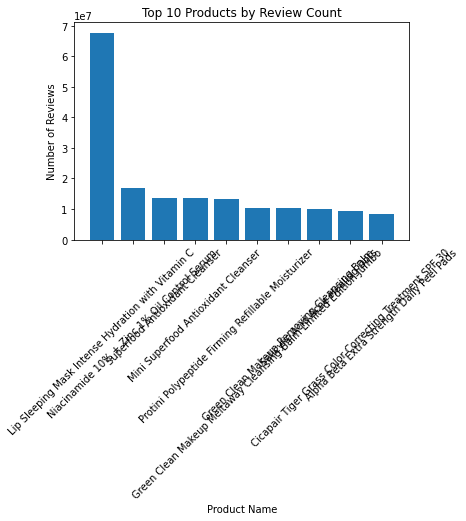

In [0]:

# Sort the data based on review counts in descending order and select the top 10 products
top_products = df.groupBy('product_id', 'product_name').agg({'reviews': 'sum'}).withColumnRenamed('sum(reviews)', 'total_reviews')
top_products = top_products.orderBy(desc('total_reviews')).limit(10)

# Extract product names and review counts from the DataFrame
products = [row['product_name'] for row in top_products.collect()]
review_counts = [row['total_reviews'] for row in top_products.collect()]

# Plotting the bar chart
plt.bar(products, review_counts)
plt.xlabel("Product Name")
plt.ylabel("Number of Reviews")
plt.title("Top 10 Products by Review Count")
plt.xticks(rotation=45)
plt.show()


Top  product on the basis of reviews are Lip Sleeping Mask Intense Hydration with Vitamin C

##### Top 10 products based on rating

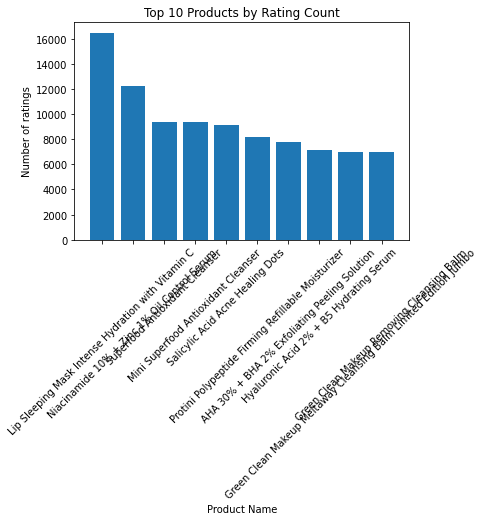

In [0]:

# Sort the data based on rating counts in descending order and select the top 10 products
top_products = df.groupBy('product_id', 'product_name').agg({'rating': 'sum'}).withColumnRenamed('sum(rating)', 'total_reviews')
top_products = top_products.orderBy(desc('total_reviews')).limit(10)

# Extract product names and rating counts from the DataFrame
products = [row['product_name'] for row in top_products.collect()]
review_counts = [row['total_reviews'] for row in top_products.collect()]

# Plotting the bar chart
plt.bar(products, review_counts)
plt.xlabel("Product Name")
plt.ylabel("Number of ratings")
plt.title("Top 10 Products by Rating Count")
plt.xticks(rotation=45)
plt.show()


Top product based on rating is Lip Sleeping Mask Intense Hydration with Vitamin C.

##### Which ingredients are in demand?

In [0]:
# Split the ingredients column by comma and explode the resulting array into multiple rows
exploded_df = df.withColumn("ingredients", explode(split(df["ingredients"], ",")))

# Calculate the count of each ingredient
ingredient_counts = exploded_df.groupBy("ingredients").count()

##### Top 10 ingredients

In [0]:
top_10 = ingredient_counts.orderBy("count", ascending=False).head(10)


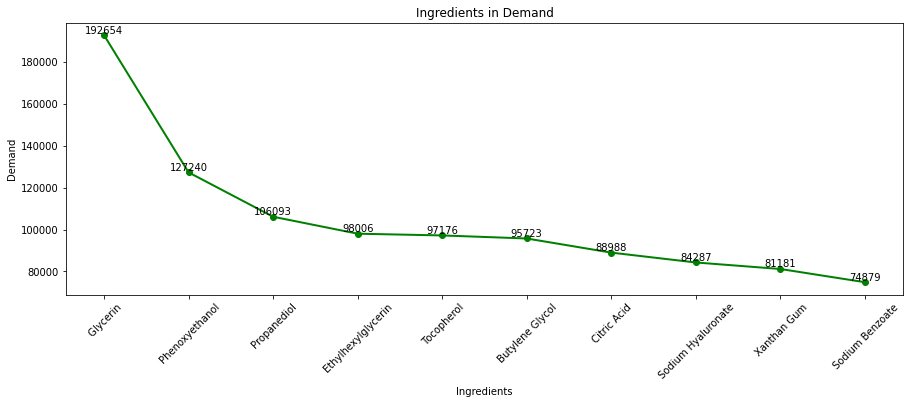

In [0]:
top_10_pd = pd.DataFrame(top_10, columns=['ingredient', 'count'])

# Plot the line chart
fig, ax = plt.subplots(figsize=(15, 5))

ax.plot(top_10_pd['ingredient'], top_10_pd['count'], marker='o', markersize=6, color='green', linewidth=2)

# Add labels to the data points
for i, count in enumerate(top_10_pd['count']):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.xlabel('Ingredients')
plt.ylabel('Demand')
plt.title('Ingredients in Demand')
plt.xticks(rotation=45)

plt.show()

In [0]:
least_10 = ingredient_counts.orderBy("count", descending=False).head(10)


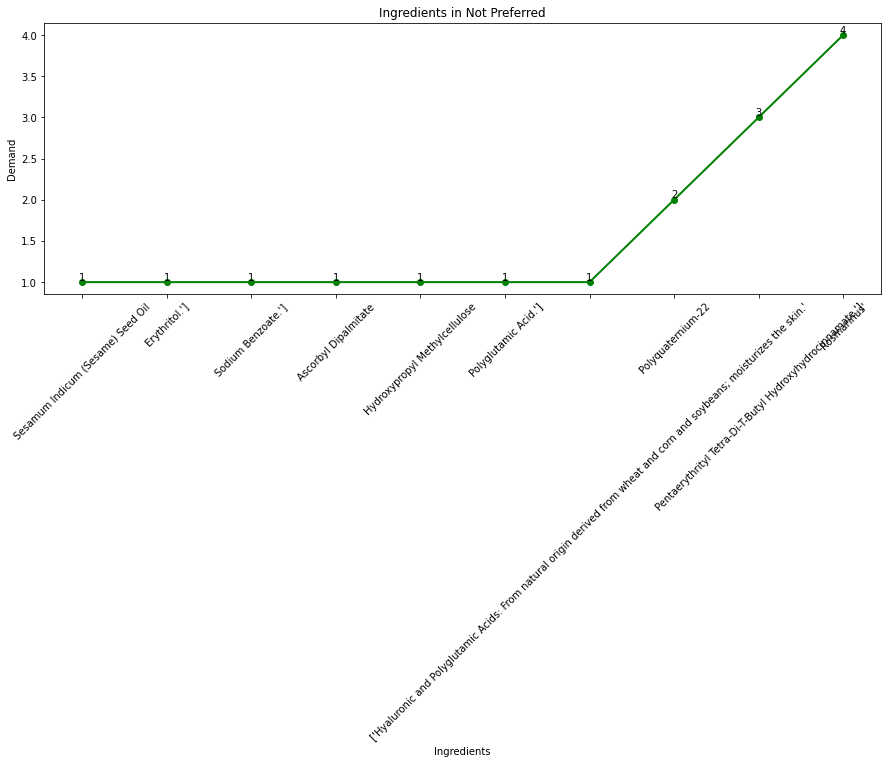

In [0]:
last_10_pd = pd.DataFrame(least_10, columns=['ingredient', 'count'])

# Plot the line chart
fig, ax = plt.subplots(figsize=(15, 5))

ax.plot(last_10_pd['ingredient'], last_10_pd['count'], marker='o', markersize=6, color='green', linewidth=2)

# Add labels to the data points
for i, count in enumerate(last_10_pd['count']):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.xlabel('Ingredients')
plt.ylabel('Demand')
plt.title('Ingredients in Not Preferred')
plt.xticks(rotation=45)

plt.show()

Top 10 ingredients used in the products are Glycerin,Phenoxyethanol, Propanediol and not preferred ingredients are Erythritol and Sesamum Indicum(sesame)Seed oil and so on.

#####  Most preferred Ingredients in each product with top 3 highest reviewed products highlighted

In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import col, count, row_number

# Assuming you have a DataFrame named 'df' with columns 'product_id', 'ingredients', and 'review_text'

# Define the window specification for ranking by review_count in descending order
windowSpec = Window.orderBy(col("review_count").desc())

# Group by product_id and ingredients, count the number of reviews, and add the rank column
df_analysis = df.groupby("product_id", "ingredients") \
    .agg(count("review_text").alias("review_count")) \
    .withColumn("rank", row_number().over(windowSpec))

df_analysis.show()


+----------+--------------------+------------+----+
|product_id|         ingredients|review_count|rank|
+----------+--------------------+------------+----+
|   P420652|['Diisostearyl Ma...|        4201|   1|
|   P427417|['Aqua (Water), N...|        2940|   2|
|   P411387|['Water/Aqua/Eau,...|        2335|   3|
|   P441644|['Water/Aqua/Eau,...|        2334|   4|
|   P421275|['Salicylic Acid ...|        2230|   5|
|   P427421|['Water/Aqua/Eau,...|        2213|   6|
|   P411540|['Water, Centella...|        1779|   7|
|   P427419|['Water, Sodium H...|        1757|   8|
|   P442563|['Glycolic Acid, ...|        1718|   9|
|   P417238|['Cetyl Ethylhexa...|        1667|  10|
|   P450271|['Alcohol Denat.,...|        1667|  11|
|   P471546|['Water, Centella...|        1628|  12|
|   P441101|['Aqua/Water/Eau,...|        1605|  13|
|   P431180|['Water, Dihydrox...|        1583|  14|
|   P458219|['Opuntia Ficus-I...|        1568|  15|
|   P467762|['Opuntia Ficus-I...|        1568|  16|
|   P454380|

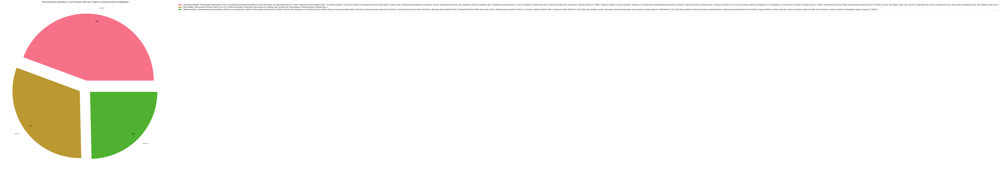

In [0]:

# Filter only the top ranked rows
df_top_3 = df_analysis.filter(col("rank") <= 3)

# Convert columns to lists
highest_sold = df_top_3.select(col("review_count")).rdd.flatMap(lambda x: x).collect()
highest_sold_product_id = df_top_3.select(col("product_id")).rdd.flatMap(lambda x: x).collect()
highest_sold_ingredients = df_top_3.select(col("ingredients")).rdd.flatMap(lambda x: x).collect()

# Define exploding pie
explode = [0.1, 0.1, 0.1]

# Define Seaborn color palette
colors = sns.color_palette('husl')

fig, ax = plt.subplots(figsize=(20, 20))

patches, texts, autotexts = plt.pie(highest_sold, labels=highest_sold_product_id, explode=explode, colors=colors,
                                   pctdistance=0.9, autopct='%.0f%%')

# Reduce the fontsize of the labels
[_.set_fontsize(7) for _ in texts]
ax.legend(highest_sold_ingredients, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title("Most preferred Ingredients in each product with top 3 highest reviewed products highlighted")
plt.show()


#### Classification of skin tone

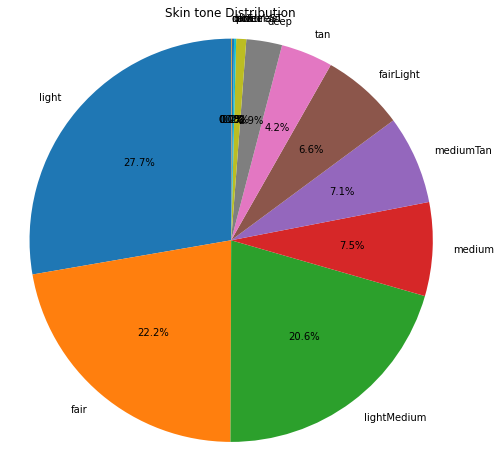

In [0]:

# Convert the DataFrame to a Pandas DataFrame
pandas_df = df.select('skin_tone').toPandas()

# Calculate the count of each category
category_counts = pandas_df['skin_tone'].value_counts()

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Skin tone Distribution")
plt.axis('equal')  
plt.show()


On the basis of above piechart most of the people who reviewd the products have light skin.

##### Rating distribution

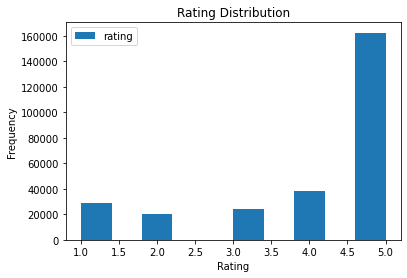

In [0]:

# Plotting a histogram for rating
df.select('rating').toPandas().plot.hist(bins=10)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Rating Distribution')
plt.show()


Most of the ratings are 5 and least rating are 2 in the products

##### Unique categories in different columns like primary,secondary,tertiary,brand name andskin type

In [0]:
import pandas as pd
from itertools import zip_longest

# Unique categories in primary_category
primary_categories = df.select('primary_category').distinct().rdd.flatMap(lambda x: x).collect()

# Unique categories in tertiary_category
tertiary_categories = df.select('tertiary_category').distinct().rdd.flatMap(lambda x: x).collect()

# Unique categories in brand_name
brand_names = df.select('brand_name').distinct().rdd.flatMap(lambda x: x).collect()

# Unique categories in skin_type
skin_types = df.select('skin_type').distinct().rdd.flatMap(lambda x: x).collect()

# Ensure all lists have the same length by filling missing values with None
data = zip_longest(primary_categories, tertiary_categories, brand_names, skin_types)

# Create a DataFrame with the unique categories
categories_df = pd.DataFrame(data, columns=['Primary Category', 'Tertiary Category', 'Brand Name', 'Skin Type'])

# Display the DataFrame as a table
display(categories_df)


Primary Category,Tertiary Category,Brand Name,Skin Type
Skincare,Moisturizers,ROSE INC,oily
null,Beauty Supplements,Caudalie,combination
null,Facial Rollers,Mario Badescu,normal
null,Blemish & Acne Treatments,innisfree,dry
null,Sheet Masks,Moon Juice,null
null,Eye Masks,Saint Jane Beauty,null
null,Night Creams,Tower 28 Beauty,null
null,Face Serums,Benefit Cosmetics,null
null,null,Hanni,null
null,Toners,Skinfix,null


##### Top 10 brand names

In [0]:
#Filter out rows with null values in brand_name
filtered_df = df.filter(col('brand_name').isNotNull())

# Category counts in brand_name
brand_name_counts =  df.groupBy('brand_name').count().orderBy(col('count').desc()).limit(10).toPandas()


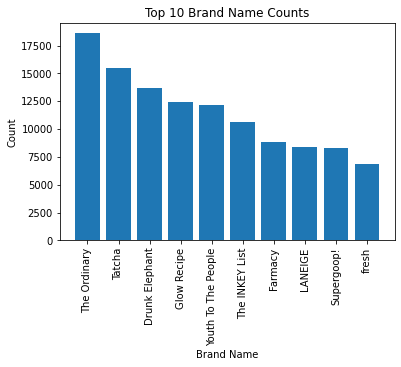

In [0]:

# Plotting a bar chart for top 10 brand_name counts
plt.bar(brand_name_counts['brand_name'], brand_name_counts['count'])
plt.xlabel('Brand Name')
plt.ylabel('Count')
plt.title('Top 10 Brand Name Counts')
plt.xticks(rotation=90)
plt.show()


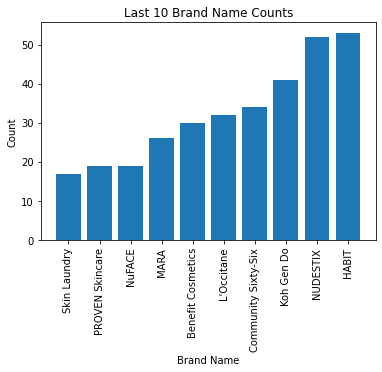

In [0]:
#Filter out rows with null values in brand_name
filtered_df = df.filter(col('brand_name').isNotNull())

# Category counts in brand_name
brand_name_counts =  df.groupBy('brand_name').count().orderBy(col('count').asc()).limit(10).toPandas()
# Plotting a bar chart for last 10 brand_name counts
plt.bar(brand_name_counts['brand_name'], brand_name_counts['count'])
plt.xlabel('Brand Name')
plt.ylabel('Count')
plt.title('Last 10 Brand Name Counts')
plt.xticks(rotation=90)
plt.show()

Top brand name is The ordinary and least brand name is Skin Laundry.

##### Skin type distribution

In [0]:
# Category counts in skin_type
skin_type_counts = df.groupBy('skin_type').count().orderBy(col('count').desc()).toPandas()
print("Skin Type Counts:")
display(skin_type_counts)

Skin Type Counts:


skin_type,count
combination,146920
dry,55825
oily,36071
normal,34753


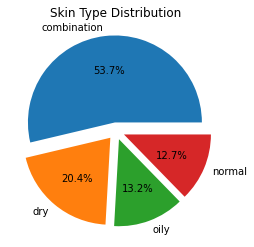

In [0]:
# Splitting the pie chart
explode = [0.1] * len(skin_type_counts)  # Set the explode values for each category

# Plotting a splitted pie chart for skin_type counts
plt.pie(skin_type_counts['count'], labels=skin_type_counts['skin_type'], explode=explode, autopct='%1.1f%%')
plt.title('Skin Type Distribution')
plt.show()

####Most loved Skincare Products

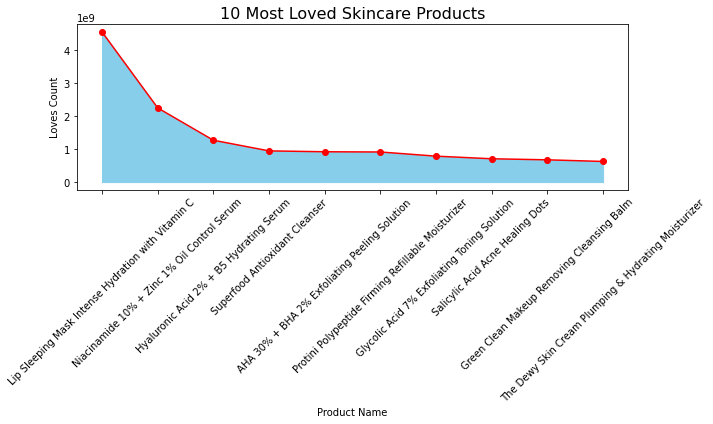

In [0]:

df_skincare_loved_product = df.filter((df['primary_category'] == "Skincare") & (df['secondary_category'] != "High Tech Tools")) \
    .groupby(['brand_name', 'product_name']).agg(F.sum('loves_count').alias('loves_sum')).sort(F.desc('loves_sum')).limit(10).toPandas()

plt.figure(figsize=(10, 6))
plt.fill_between(df_skincare_loved_product['product_name'], df_skincare_loved_product['loves_sum'], color='skyblue')
plt.plot(df_skincare_loved_product['product_name'], df_skincare_loved_product['loves_sum'], marker='o', color='red')

plt.title('10 Most Loved Skincare Products', fontsize=16)
plt.xlabel('Product Name')
plt.ylabel('Loves Count')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



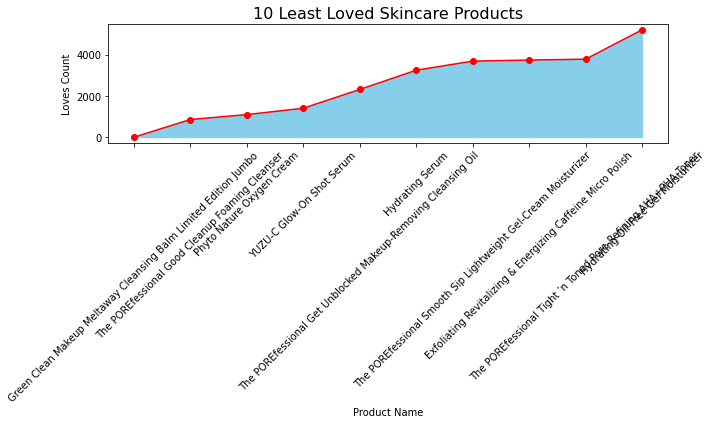

In [0]:
df_skincare_loved_product = df.filter((df['primary_category'] == "Skincare") & (df['secondary_category'] != "High Tech Tools")) \
    .groupby(['brand_name', 'product_name']).agg(F.sum('loves_count').alias('loves_sum')).sort(F.asc('loves_sum')).limit(10).toPandas()

plt.figure(figsize=(10, 6))
plt.fill_between(df_skincare_loved_product['product_name'], df_skincare_loved_product['loves_sum'], color='skyblue')
plt.plot(df_skincare_loved_product['product_name'], df_skincare_loved_product['loves_sum'], marker='o', color='red')

plt.title('10 Least Loved Skincare Products', fontsize=16)
plt.xlabel('Product Name')
plt.ylabel('Loves Count')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Most loved makeup product is Lip sleeping mask Intense hydration with Vitamin c and least loved product is Green Clean Makeup Meltaway Cleansing Balm Limited Edition Jumbo on the basis of the people added it as a favorite.

#### Average rating per brand

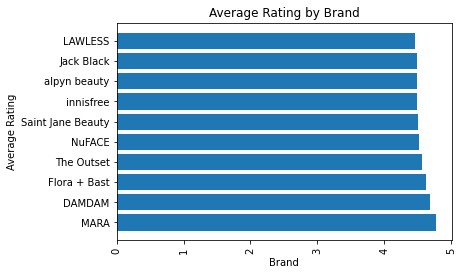

In [0]:
# Drop rows with missing values in the 'brand_name' column
df_cleaned = df.filter(col('brand_name').isNotNull())

# Group by brand_name and calculate the average rating
brand_ratings = df_cleaned.groupBy('brand_name').avg('rating').toPandas()

# Sort by average rating in descending order
brand_ratings = brand_ratings.sort_values('avg(rating)', ascending=False).head(10)

# Plotting a bar chart for brand ratings
plt.barh(brand_ratings['brand_name'], brand_ratings['avg(rating)'])
plt.xlabel('Brand')
plt.ylabel('Average Rating')
plt.title('Average Rating by Brand')
plt.xticks(rotation=90)
plt.show()

MARA has the highest average rating among other products.

#### Total feedback count throughout the year

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


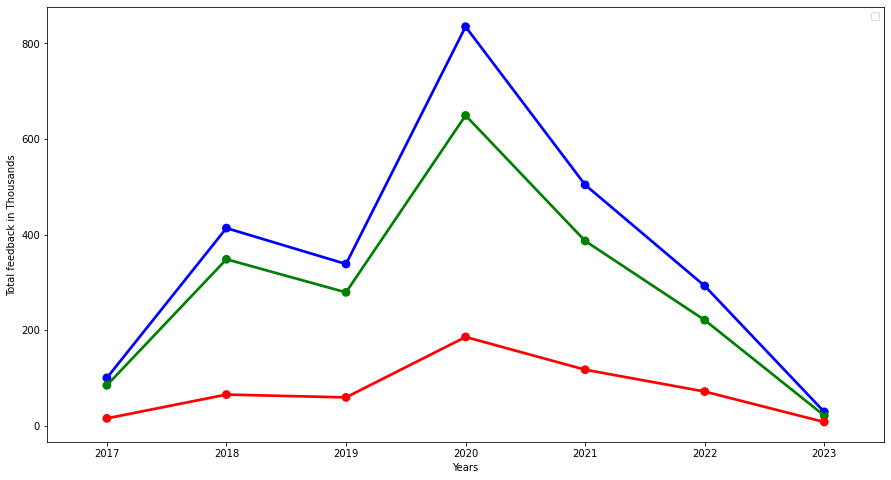

In [0]:


# Calculate the sums of feedback counts by year
total_feedback_count = df.groupBy('year').agg(spark_sum('total_feedback_count').alias('total_feedback_count'))
total_pos_feedback_count = df.groupBy('year').agg(spark_sum('total_pos_feedback_count').alias('total_pos_feedback_count'))
total_neg_feedback_count = df.groupBy('year').agg(spark_sum('total_neg_feedback_count').alias('total_neg_feedback_count'))

# Convert the result to Pandas DataFrame
total_feedback_count = total_feedback_count.toPandas()
total_pos_feedback_count = total_pos_feedback_count.toPandas()
total_neg_feedback_count = total_neg_feedback_count.toPandas()

# Plotting using Matplotlib and Seaborn
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.pointplot(data=total_feedback_count, x='year', y='total_feedback_count', color="blue", label="Total all feedback", ax=ax1)
sns.pointplot(data=total_pos_feedback_count, x='year', y='total_pos_feedback_count', color="green", label="Total Positive Feedback", ax=ax1)
sns.pointplot(data=total_neg_feedback_count, x='year', y='total_neg_feedback_count', color="red", label="Total Negative Feedback", ax=ax1)

ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,.0f}".format(x / 1000)))  # Convert y-axis values to thousands
ax1.set_ylabel("Total feedback in Thousands")
ax1.set_xlabel("Years")
ax1.legend()

plt.show()



Highest no of feedbacks are passed on the year 2020 and least on year 2023.

#### Reviews by sentiment on secondary category

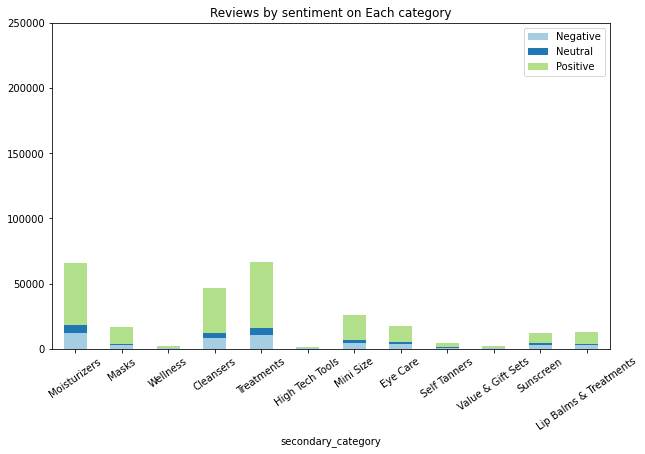

In [0]:
rating_counts = df.groupBy('sentiment','secondary_category').agg(F.count('*').alias('rating'))

# Pivoting the sentiment column to create separate columns for each sentiment
pivoted_df = rating_counts.groupBy('secondary_category')\
                     .pivot('sentiment', ['Negative', 'Neutral', 'Positive'])\
                     .sum('rating')\
                     .fillna(0)

# Converting the pivoted DataFrame to Pandas
pandas_df = pivoted_df.toPandas()

# Create a stacked bar plot of the counts
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_ylim(0, 250000)
ax.set_title("Reviews by sentiment on Each category")
colors = sns.color_palette('Paired')
pandas_df.plot(kind='bar', stacked=True, x='secondary_category',color=colors,ax=ax)
ax.set_xticklabels(pandas_df['secondary_category'],rotation=35);

Most of reviews are done for Treatments and Moisturizers and least on high tech tools and Value and gift sets.We can see most of the sentiments are positive and least the neutral.

#### Volume of products in each category

In [0]:
df_grouped = df_makeup_products.groupby("primary_category",'secondary_category','tertiary_category').agg(F.count("*").alias("count"))
display(df_grouped)

primary_category,secondary_category,tertiary_category,count
Skincare,Cleansers,Toners,80
Men,Shaving,Shaving,10
Makeup,Makeup Palettes,null,20
Hair,Hair Styling & Treatments,Hair Masks,120
Hair,Hair Styling & Treatments,Hair Spray,28
Mini Size,Bath & Body,null,7
Tools & Brushes,Beauty Tools,null,1
Fragrance,Candles & Home Scents,Candles,193
'All Hair Types','Good for: Dryness','Good for: Flaky/Dry Scalp',1
Hair,Hair Styling & Treatments,Leave-In Conditioner,59


#### Distinct products in each category

In [0]:
df_popular_products = df.groupby("primary_category",'secondary_category','tertiary_category').agg(F.countDistinct("product_id").alias("count"))
display(df_popular_products)

primary_category,secondary_category,tertiary_category,count
Skincare,Cleansers,Toners,46
Skincare,High Tech Tools,Facial Cleansing Brushes,3
Skincare,Cleansers,Face Wash & Cleansers,129
Skincare,Moisturizers,BB & CC Creams,4
Skincare,Sunscreen,Body Sunscreen,3
Skincare,Masks,Face Masks,73
Skincare,Eye Care,Eye Creams & Treatments,104
Skincare,High Tech Tools,Hair Removal,2
Skincare,Wellness,Facial Rollers,3
Skincare,High Tech Tools,Anti-Aging,5


#### Rating volume by customers

In [0]:
rating_vol = df.groupBy('author_id').count().orderBy('count',ascending=False)
display(rating_vol)

author_id,count
24998050674,83
1930716686,76
25452917574,66
23668221929,57
2656520784,51
9075527849,51
2118515570,48
2776710623,46
6830612821,45
23940992103,44


#### Sentiment trend in year 2020

From above we got to know year 2020 was the top year for review so we are taking year 2020 to analyze sentiment trend.

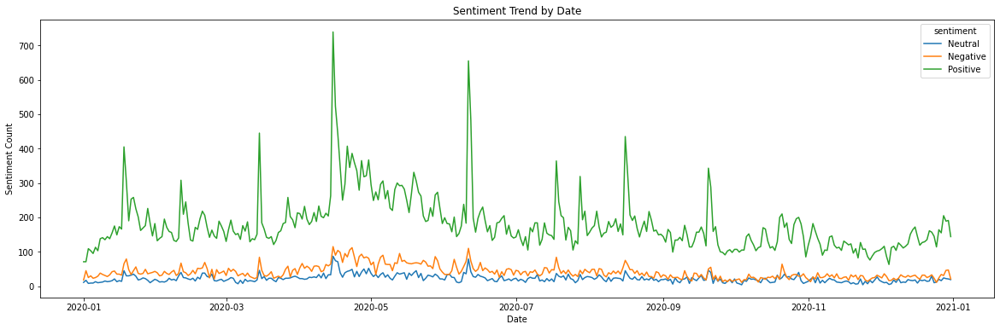

In [0]:
review_df = df.select(F.col("submission_time"), F.col("review_text"),F.col("sentiment")).filter(F.year(F.col("submission_time")) == 2020)
sentiment_trend_df = review_df.groupBy("submission_time", "sentiment").agg(F.count("*").alias("sentiment_count"))

fig, ax = plt.subplots(figsize=(20, 6))
sns.lineplot(x="submission_time", y="sentiment_count", hue="sentiment", data=sentiment_trend_df.toPandas())
ax.set_xlabel("Date")
ax.set_ylabel("Sentiment Count")
ax.set_title("Sentiment Trend by Date")
plt.show()


In year 2020 April had the highest positive sentiment collected whereas dec had the least. For neutral and negative they seem to be preety linear.

#### Analysing customer characterstics

In [0]:
# grouping customer_id
grouped_customer = df.groupBy('author_id','sentiment')

# categorizing users based on their reviewing frequency
reviews_per_user = grouped_customer.count().orderBy('count', ascending=False)

regular_users = reviews_per_user.filter(F.col('count') > 50).select('author_id').distinct()
medium_users = reviews_per_user.filter((F.col('count') <= 50) & (F.col('count') > 20)).select('author_id').distinct()

In [0]:
def visualize_user_behaviour(input_df,title,size):
    
    # Pivoting the sentiment column to create separate columns for each sentiment
    pivoted_df = input_df.groupBy('author_id')\
                     .pivot('sentiment', ['Negative', 'Neutral', 'Positive'])\
                     .sum('count')\
                     .fillna(0)
    # Converting the pivoted DataFrame to Pandas
    pandas_df = pivoted_df.toPandas()
    # Create a stacked bar plot of the counts
    fig, ax = plt.subplots(figsize= size)
    colors = sns.color_palette('Dark2')
    pandas_df.plot(kind='bar', stacked=True, x='author_id',color=colors,ax=ax)
    ax.set_title(title)
    ax.set_xticklabels(pandas_df['author_id'],rotation=35);

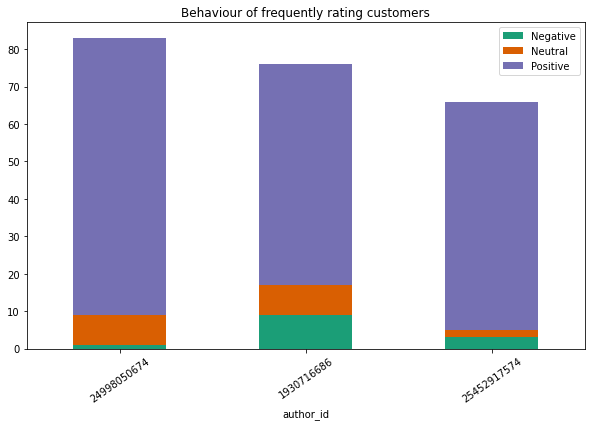

In [0]:
regular_user_behaviour = reviews_per_user.join(regular_users, on='author_id', how='inner')
visualize_user_behaviour(regular_user_behaviour,title = "Behaviour of frequently rating customers",size=(10,6))


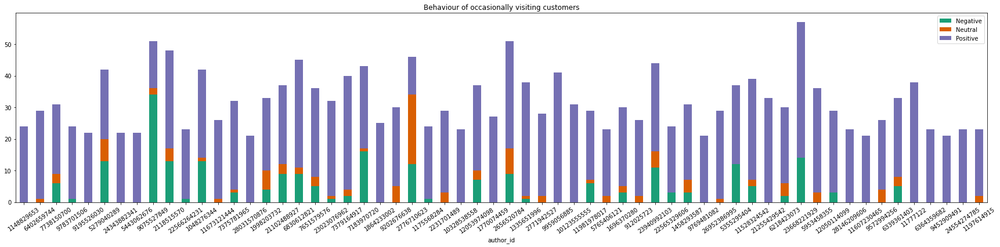

In [0]:
medium_user_behaviour = reviews_per_user.join(medium_users, on='author_id', how='inner')
visualize_user_behaviour(medium_user_behaviour,title = "Behaviour of occasionally visiting customers",size=(30,6))

Frequently visiting customer are happy with the products so most of the times they leave positive reviews but occasionaly visiting customer have fluctuations.

#### Highly bought products

In [0]:
# frequent customers
ratings_per_user = df.groupBy('author_id').count().filter(F.col('count')>30)

# Joining ratings_per_user with df_reviews_final on customer_id column
frequent_ratings = ratings_per_user.join(df, on='author_id', how='inner')

# Group by product_id to get count of ratings for each product by frequent customers
frequent_products = frequent_ratings.groupBy('product_name','primary_category').agg({'count': 'sum'}).withColumnRenamed('sum(count)', 'total_feedback_count').filter(F.col('total_feedback_count') > 30).orderBy("total_feedback_count",ascending=False).limit(10)

display(frequent_products)

product_name,primary_category,total_feedback_count
Midnight Recovery Concentrate Moisturizing Face Oil,Skincare,534
Creamy Eye Treatment with Avocado,Skincare,451
Watermelon Glow PHA + BHA Pore-Tight Toner,Skincare,442
Mini Watermelon Glow PHA + BHA Pore-Tight Toner,Skincare,442
Mini Unseen Sunscreen SPF 40 PA+++,Skincare,435
Unseen Sunscreen SPF 40 PA+++,Skincare,435
Good Genes All-In-One AHA Lactic Acid Treatment,Skincare,391
Lip Sleeping Mask Intense Hydration with Vitamin C,Skincare,377
B-Hydra Intensive Hydration Serum with Hyaluronic Acid,Skincare,376
Cream Skin Toner & Moisturizer,Skincare,365


#### Taking only top product for further analysis

In [0]:
df_top_1 = df.filter(F.col("product_name")== "Midnight Recovery Concentrate Moisturizing Face Oil")
product_ratings = df_top_1.groupBy("product_name", "rating").agg(F.count("*").alias("count"))
product_totals = product_ratings.groupBy("product_name").agg(F.count("*").alias("total"))
product_percentages = product_ratings.join(product_totals, "product_name") \
    .withColumn("percentage", F.round((F.col("count") / F.col("total")) * 100, 2)) \
    .select("product_name", "rating", "percentage")

In [0]:
display(product_percentages)

product_name,rating,percentage
Midnight Recovery Concentrate Moisturizing Face Oil,5,10120.0
Midnight Recovery Concentrate Moisturizing Face Oil,3,1240.0
Midnight Recovery Concentrate Moisturizing Face Oil,4,1720.0
Midnight Recovery Concentrate Moisturizing Face Oil,1,2520.0
Midnight Recovery Concentrate Moisturizing Face Oil,2,1000.0


##### Analyzing sentiment scores over time for that top 1 product

In [0]:
def get_sentiment_score(review_text: pd.Series) -> pd.Series:
    return review_text.apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# Define pandas_udf with FloatType return type
get_sentiment_score_pudf = pandas_udf(get_sentiment_score, FloatType())

# Apply the pandas_udf on the review_body column
sentiment_trend_df = df_top_1.withColumn("sentiment_score", get_sentiment_score_pudf(F.col("review_text"))).withColumn("review_month", F.month("submission_time"))


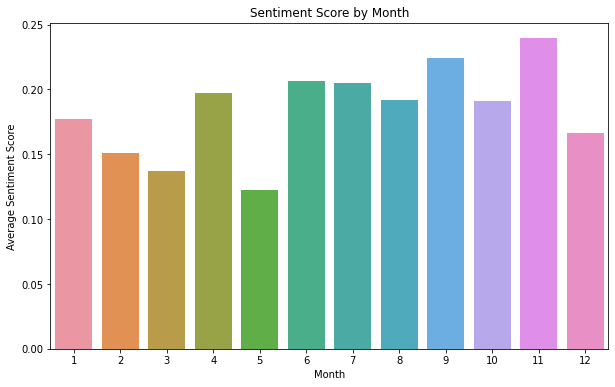

Out[160]: (None,)

In [0]:
# Group by month and calculate the average sentiment score
monthly_sentiment_df = sentiment_trend_df.groupBy('review_month').avg('sentiment_score')

# Convert to Pandas DataFrame and sort by month
monthly_sentiment_pd = monthly_sentiment_df.toPandas().sort_values('review_month')

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='review_month', y='avg(sentiment_score)', data=monthly_sentiment_pd)
plt.xlabel('Month')
plt.ylabel('Average Sentiment Score')
plt.title('Sentiment Score by Month')
plt.show(),

For the product "Midnight Recovery Concentrate Moisturizing Face Oil" most of the review were done in November and September and least on May.

#### Sentiment Analysis on review text

In [0]:

# Tokenize the review_text column
tokenizer = RegexTokenizer(inputCol='review_text', outputCol='tokens', pattern='\\W')
df_tokenized = tokenizer.transform(df)

# Remove stopwords from the tokens
remover = StopWordsRemover(inputCol='tokens', outputCol='filtered_tokens')
df_filtered = remover.transform(df_tokenized)

# Count vectorization to convert text into numerical features
count_vectorizer = CountVectorizer(inputCol='filtered_tokens', outputCol='features')
count_vectorizer_model = count_vectorizer.fit(df_filtered)
df_vectorized = count_vectorizer_model.transform(df_filtered)

# Specify the DBFS path to the pretrained sentiment analysis model
model_path = 'dbfs:/mnt/my_bucket/models/pretrained_model'

# Load the pre-trained sentiment analysis model
sentiment_model = PipelineModel.load(model_path)

# Tokenize the text in the DataFrame
tokenizer = Tokenizer(inputCol="review_text", outputCol="review_tokens_temp")
df_token = tokenizer.transform(df_vectorized)

# Select the necessary columns for analysis
df_sentiment_analysis = df_token.select(col("review_text"), col("sentiment"), col("filtered_tokens"))


In [0]:

# Extract insights from sentiment analysis results
sentiment_distribution = df_sentiment_analysis.groupBy('sentiment').count()

# Display the insights
print("Sentiment Distribution:")

Sentiment Distribution:


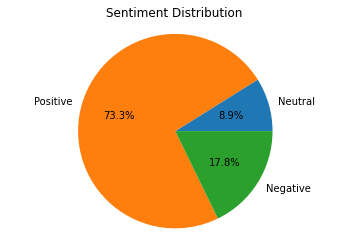

In [0]:
# Convert the result to a Pandas DataFrame
sentiment_counts_pd = sentiment_distribution.toPandas()

# Plot the pie chart
plt.pie(sentiment_counts_pd['count'], labels=sentiment_counts_pd['sentiment'], autopct='%1.1f%%')
plt.title('Sentiment Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [0]:
display(df_sentiment_analysis)

review_text,sentiment,filtered_tokens
I would not repurchase as there are better ones out there. It dose work at keeping what moisture I have in my lips but dose not add any which really sucks.,Neutral,"List(repurchase, better, ones, dose, work, keeping, moisture, lips, dose, add, really, sucks)"
"I love it, the flavour and the little applicator that comes with it is very good. I love that you don’t need to much of it and the container lasts forever. The price is a bit high for my taste. But it does last a long time . But I do find that it doesn’t hydrate the lips for a long time like in order to keep the lips hydrated you need to use it every night",Positive,"List(love, flavour, little, applicator, comes, good, love, need, much, container, lasts, forever, price, bit, high, taste, last, long, time, find, doesn, hydrate, lips, long, time, like, order, keep, lips, hydrated, need, use, every, night)"
I can not live with out this product it leaves your lips baby smooth and super hydrated this mask goes on lightweight so you can put it on early before bed and you’ll be just fine,Positive,"List(live, product, leaves, lips, baby, smooth, super, hydrated, mask, goes, lightweight, put, early, bed, ll, fine)"
"Before buying this product, you have to understand the nature of the product— and what it’s intended to achieve. I see so many bad reviews for this “lip balm” (it’s not a lip balm) because reviewers experienced peeling (exfoliation). This is a MASK that’s intended to exfoliate (peel). If you have problem lips to begin with, things may get worse before they get better. Stick with it! If you use every day for a week, your lips will be beautifully smooth and plump!",Positive,"List(buying, product, understand, nature, product, intended, achieve, see, many, bad, reviews, lip, balm, lip, balm, reviewers, experienced, peeling, exfoliation, mask, intended, exfoliate, peel, problem, lips, begin, things, may, get, worse, get, better, stick, use, every, day, week, lips, beautifully, smooth, plump)"
"This lip mask is so good for dehydrated lips. I put this on at night, and my lips are so hydrated, even the next morning and into the afternoon. Thank you Laneige❤️❤️",Positive,"List(lip, mask, good, dehydrated, lips, put, night, lips, hydrated, even, next, morning, afternoon, thank, laneige)"
I love this lip mask. I have really sensitive lips. This is by day the BEST !!!,Positive,"List(love, lip, mask, really, sensitive, lips, day, best)"
I did like the pink one more because the purple scent is stronger. But the product is goals✨ I use it at night mostly and woke up still with it. Good amount of product and lasted me like 6 months. Cant wait to try the new flavor!,Positive,"List(like, pink, one, purple, scent, stronger, product, goals, use, night, mostly, woke, still, good, amount, product, lasted, like, 6, months, cant, wait, try, new, flavor)"
"Feels great on the lips and smells amazing!! I’m sensitive to scents but this is pretty subtle when applied. I use this at night and my cerave healing ointment as my daytime chapstick and my lips have never been softer. The jar is way bigger than expected and with how far a small amount goes, this will last me at LEAST a year.",Positive,"List(feels, great, lips, smells, amazing, m, sensitive, scents, pretty, subtle, applied, use, night, cerave, healing, ointment, daytime, chapstick, lips, never, softer, jar, way, bigger, expected, far, small, amount, goes, last, least, year)"
"This is a miracle product for my post-Canadian-winter dry and cracked lips. It smells amazing, goes on smooth with no stickiness, and leaves my lips soft and smooth.",Positive,"List(miracle, product, post, canadian, winter, dry, cracked, lips, smells, amazing, goes, smooth, stickiness, leaves, lips, soft, smooth)"
"The original - Berry (pink) is a 5/5 for me and I’ve repurchased multiple times. I decided to try one of the fun new colors / scents and went with gummy bear (purple)... I’m surprised I didn’t seem to find any reviews m

In [0]:
from pyspark.sql.functions import explode, col

positive_words = df_sentiment_analysis.select(explode('filtered_tokens').alias('positive_words')).where(col('sentiment') == 'Positive')
print("Frequently Mentioned Positive Words:")
positive_words.groupBy('positive_words').count().orderBy(col('count').desc()).show(10, truncate=False)


Frequently Mentioned Positive Words:
+--------------+------+
|positive_words|count |
+--------------+------+
|skin          |276000|
|product       |126228|
|use           |87611 |
|love          |86240 |
|like          |70750 |
|face          |68349 |
|using         |65625 |
|really        |54050 |
|ve            |53685 |
|dry           |47865 |
+--------------+------+
only showing top 10 rows



In [0]:
negative_words = df_sentiment_analysis.select(explode('filtered_tokens').alias('negative_words')).where(col('sentiment') == 'Negative')
print("Frequently Mentioned Negative Words:")
negative_words.groupBy('negative_words').count().orderBy(col('count').desc()).show(10, truncate=False)

Frequently Mentioned Negative Words:
+--------------+-----+
|negative_words|count|
+--------------+-----+
|skin          |47420|
|product       |32056|
|like          |21267|
|face          |17354|
|using         |12670|
|really        |12482|
|use           |11702|
|didn          |10692|
|used          |10616|
|dry           |10257|
+--------------+-----+
only showing top 10 rows

